# Self-supervised attempt and Zero-shot SR testing

In [19]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from pyhdf.SD import SD, SDC
from skimage.metrics import structural_similarity as ssim_sk
from piqa import SSIM
from dloader import *
from srcnn import *
from unet import *
from resunet import *
from haunet import *
from mrunet import *
from zssrnet import *

DEVICE  = "cuda:0" if torch.cuda.is_available() else "cpu"
PATH_LR = "/mnt/LOCALDATA/STUDENTS/SATELLITE/MODIS/MOD11B1"
PATH_HR = "/mnt/LOCALDATA/STUDENTS/SATELLITE/MODIS/MOD11A1"
QA      = "/home/giacomo.t/src/scanning_paired_dataset.csv"
PARAMS  = "/home/giacomo.t/src/train_params_tiles_2019_2020_2021_2022.csv"
UP_SCALE = 6
KERNEL_SIZE = 5
SEED = 8609


def plotsubpatch(subpatches, titles, suptitle, llim, ulim):
    """ General utils plot function """
    try: n = toplot.shape[0]
    except: n = len(subpatches)
    _, axs = plt.subplots(1, n, figsize=(12,4))
    for i,item in enumerate(subpatches):
        axs[i].imshow(item.squeeze().to("cpu"), vmin = llim, vmax = ulim)
        axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
    if suptitle != None:
        plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

def ssim(lr, hr):
    """ Custom SSIM implementation
    """
    lr = lr.squeeze().cpu().detach().numpy()
    hr = hr.squeeze().cpu().detach().numpy()
    return ssim_sk(lr, hr, data_range=hr.max()-hr.min(), channel_axis=0)

class PSNR:
    """Peak Signal to Noise Ratio
    img1 and img2 have range [0, 255]"""
    def __init__(self):
        self.name = "PSNR"
    @staticmethod
    def __call__(img1, img2):
        mse = torch.mean((img1 - img2) ** 2)
        return (20 * torch.log10(255.0 / torch.sqrt(mse))).item()
    
psnr = PSNR()


---

# Testing ZSSR using RGB image

Testing Zero-shot Super Resolution with RGB image from Imagenet-A

torch.Size([3, 200, 200])
Original tensor dimension: torch.Size([1, 3, 200, 200])


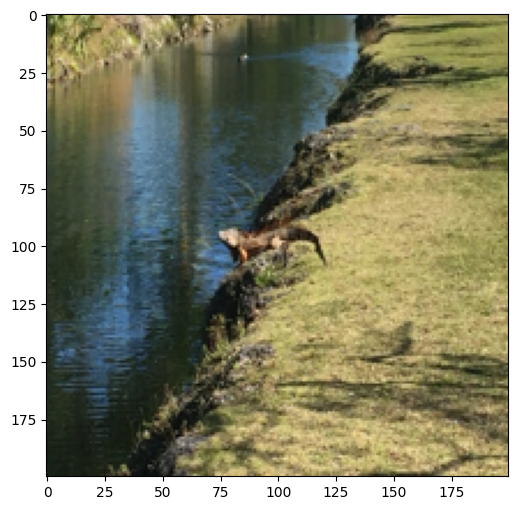

In [156]:
# Testing zsrr with alligator.jpg
imgfilename = "alligator.jpg"
resizedim = (200,200)

# Loading image (to tensor)
img = PIL.Image.open(imgfilename).convert("RGB").resize(resizedim)

# Channel selection
nchannels = 3
hr  = ttf.to_tensor(img) if nchannels == 3 else ttf.to_tensor(img)[0,:,:]
print(hr.shape)

# Normalization and params extractions (for plotting purposes)
hr = hr / hr.max()

hr = hr.reshape(1, nchannels, hr.shape[-2], hr.shape[-1])
print("Original tensor dimension:", hr.shape)

# Plotting
_, axs = plt.subplots(1, 1, figsize=(6,6))
axs.imshow(img)
plt.show()

### Rescaling
Pretext original image degradation via bicubic interpolation according to a given `scale_factor`

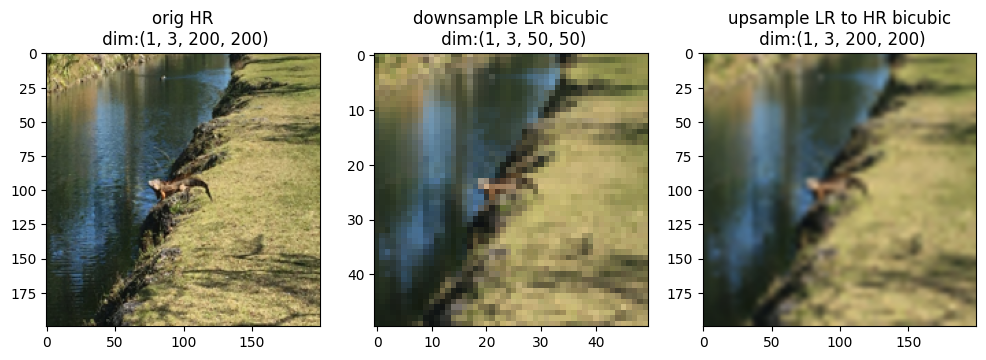

In [157]:
scale_factor = 4

# Down and Up scaling via bicubic interpolation
child    = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)

# Plot
titles = ["orig HR", "downsample LR bicubic", "upsample LR to HR bicubic"]
toplot = (hr, child, child_up)
_, axs = plt.subplots(1,len(toplot),figsize=(12,6))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze()))
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Model initialization

In [158]:
#model = ZSSRNet(input_channels=nchannels, kernel_size=3, channels=64).to(DEVICE)
model = build_unet(nchannels=nchannels).to(DEVICE)
#model = build_resunet(nchannels=nchannels).to(DEVICE)
#model = build_haunet(scale_factor, nchannels=nchannels, multi_image=False).to(DEVICE)
#model = MRUNet(n_channels=nchannels, n_resblocks=1).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer     = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.99)

#scheduler     = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
#                    factor=0.9, patience=5, threshold=0.0001, threshold_mode='abs')

# To DEVICE
hr = hr.to(DEVICE)
child = child.to(DEVICE)
child_up = child_up.to(DEVICE)

def adjust_learning_rate(optimizer, new_lr):
    """Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

### Training Loop

100%|██████████| 600/600 [00:26<00:00, 22.58it/s,  Training Loss « 0.0038711654 »]


 SR-HR:  PSNR (93.851463)  MAE (0.0038711654)
 LR-HR:  PSNR (71.599533)  MAE (0.0463126861)


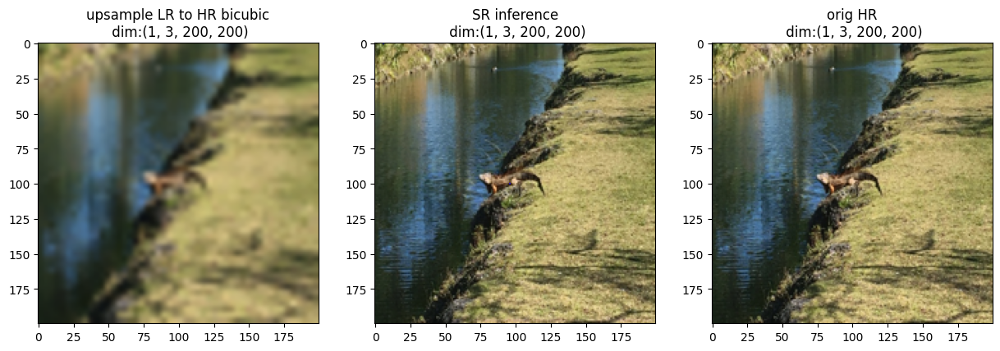

In [161]:
# Training params
nepochs = 600
adjust_learning_rate(optimizer, 10e-4)

# Training loop
model.train()
progression_bar = tqdm(range(nepochs), total=nepochs)
for e in progression_bar:
    output = model(child_up).to(DEVICE)
    loss = loss_function(output, hr)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    #scheduler.step()
    progression_bar.set_postfix_str(f" Training Loss « {(loss.item()):.10f} »")

# Inference Eval
psnr = PSNR()
print(f" SR-HR:  PSNR ({psnr(output, hr):.6f})  MAE ({loss_function(output, hr):.10f})")
print(f" LR-HR:  PSNR ({psnr(child_up, hr):.6f})  MAE ({loss_function(child_up, hr):.10f})")

# Plot
titles = ["upsample LR to HR bicubic", "SR inference", "orig HR"] 
toplot = (child_up, output, hr)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze().detach().to("cpu")))
                                    
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Now testing zeroshot upscaling
Original HR upsampling according to `scale_factor` and bicubic interpolation.

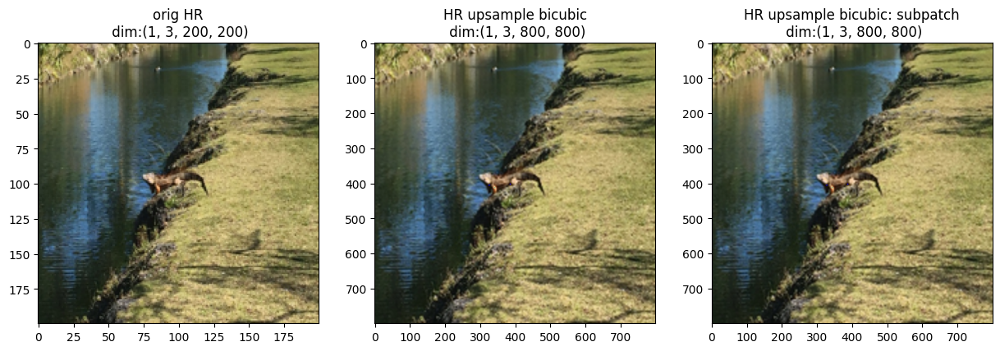

In [163]:
hr_up = F.interpolate(hr, scale_factor=scale_factor, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (800,800)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

# Plot
titles = ["orig HR", "HR upsample bicubic", "HR upsample bicubic: subpatch"] 
toplot = (hr, hr_up, hr_up_subpatch)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze().detach().to("cpu")))
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()    

Self-supervised trained model inference estimation.

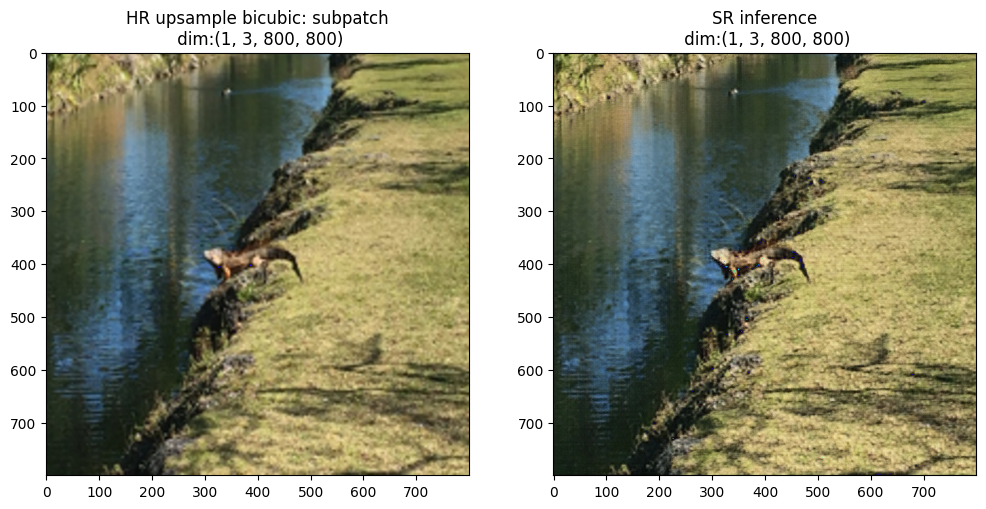

In [166]:
# Evaluating over the new upscaled version
model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)
    
# Plot
titles = ["HR upsample bicubic: subpatch", "SR inference"] 
toplot = (hr_up_subpatch, inference)
_, axs = plt.subplots(1,len(toplot),figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(ttf.to_pil_image(item.squeeze().detach().to("cpu"))) 
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()   

### Residual mapping

Avg bias: 0.0007135033956728876


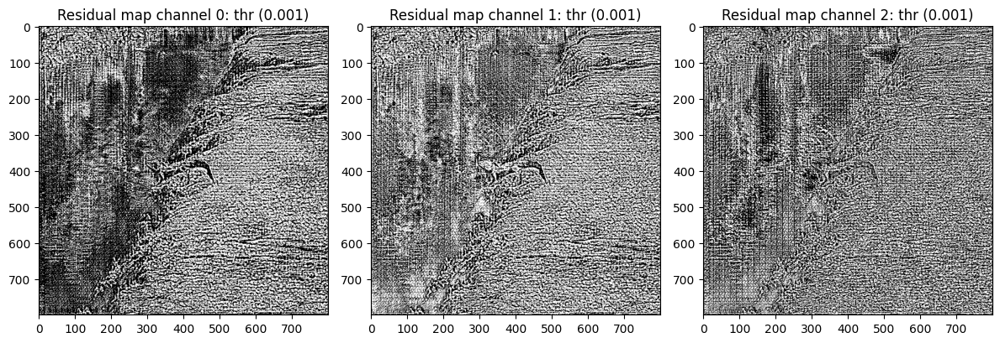

In [180]:
thr = 0.001
diff = inference.detach().to("cpu").squeeze() - hr_up_subpatch.detach().to("cpu").squeeze()
print("Avg bias:", diff.float().mean().item())

diff = torch.where(diff>thr, 1, 0)

toplot = [diff[i,:,:] for i in range(3)]
_, axs = plt.subplots(1,len(toplot),figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze(), cmap="gray")
    axs[i].set_title(f"Residual map channel {i}: thr ({thr})")
plt.tight_layout()
plt.show()


---



# Testing ZSSR using MODIS


### Dataset loading and image selection

Collected # paired HR data:  25
percentage of zero-filled: 0.0002722222125157714
data range (K)    {min, max}:  288.5199890136719 317.4200134277344
data range (norm) {min, max}:  0.9089533686637878 1.0
data params   {mean, std}: 0.9551867246627808 0.010195571929216385
data lower and upper value lim: 0.9296977948397398 0.9806756544858217


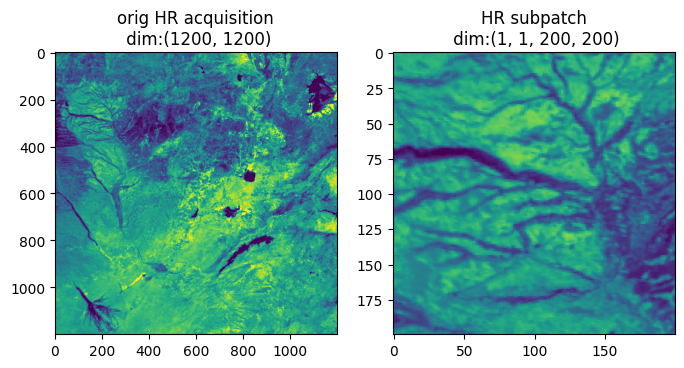

In [16]:
# Load MODIS dataset 
mds = MODIS_dataset_single(hr_filepath=PATH_HR, qa=QA, zerof_thr=0.01,
    cloud_thr=0.01, error_thr=0.01, impute_thr=0.01, up_scale=UP_SCALE, kernel_size=KERNEL_SIZE,
    train_params=PARAMS, data_set="train", seed=SEED)

# HR image reading and rescaling values by sf=0.02 (in K)
imgindex = 2
filename = mds.qa.iloc[imgindex].hr_files
data = SD(os.path.join(PATH_HR, filename), SDC.READ)
data = data.select("LST_Day_1km")[:,:].astype(np.float64)
data = torch.Tensor(data*0.02)

# Imputing zerofilled
print("percentage of zero-filled:", torch.where(data==0, 1, 0).float().mean().item())
data = torch.where(data==0, data[data!=0].mean(), data)

# Rescaling dividing by max value --> [0,1]
print("data range (K)    {min, max}: ", data.min().item(), data.max().item())
dmin, dmax = data.min().item(), data.max().item()
data = data / dmax
print("data range (norm) {min, max}: ", data.min().item(), data.max().item())

# Collect mean and std to clip histogram plotting
datamean, datastd = data.mean().item(), data.std().item()
print("data params   {mean, std}:", datamean, datastd)

# Upper and lower value limits for visualisation purposes
llim, ulim = datamean - 2.5*datastd, datamean + 2.5*datastd
print("data lower and upper value lim:", llim, ulim)

# Subpatch extraction
hlim, wlim = (200,400), (100,300)
hr = data[hlim[0]:hlim[1], wlim[0]:wlim[1]]
hr = hr.reshape(1, 1, hr.shape[-2], hr.shape[-1])

# Plot
titles = ("orig HR acquisition", "HR subpatch")
toplot = (data, hr)
_, axs = plt.subplots(1, len(toplot), figsize=(8,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Rescaling
Pretext original image degradation via bicubic interpolation according to a given `scale_factor`

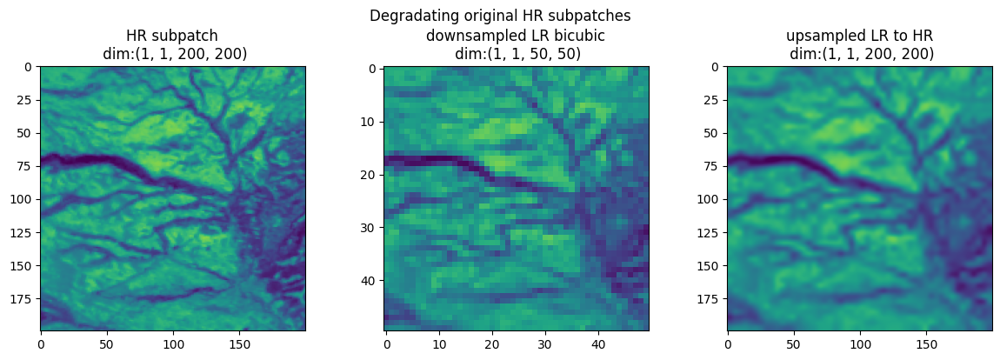

In [18]:
scale_factor = 4

# Interpolate
child = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)

# To DEVICE
hr = hr.to(DEVICE)
child = child.to(DEVICE)
child_up = child_up.to(DEVICE)

# Plot
titles = ["HR subpatch", "downsampled LR bicubic", "upsampled LR to HR"]
subpatches = [hr, child, child_up]
plotsubpatch(subpatches, titles, llim, ulim)


### Model initialization

In [5]:
nchannels = 1

# Model initialisation
#model = build_unet(nchannels=nchannels).to(DEVICE)
#model = ZSSRNet(input_channels=nchannels, kernel_size=3, channels=128).to(DEVICE)
#model = build_resunet(nchannels=nchannels).to(DEVICE)
#model = build_haunet(scale_factor, nchannels=nchannels, multi_image=False).to(DEVICE)
model = MRUNet(n_channels=nchannels, n_resblocks=1).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer     = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
            factor=0.1, patience=10, threshold=1e-08, threshold_mode='abs')

def adjust_learning_rate(optimizer, new_lr):
    """Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

### Training Loop

100%|██████████| 2000/2000 [04:23<00:00,  7.60it/s, Loss «0.001144404»  Delta Loss «-0.000944689»  Delta PSNR «1.740524292»  Delta SSIM «0.261890173»] 



 SR-HR:  PSNR (101.041756)  Loss (0.0011444041)
 LR-HR:  PSNR (99.301231)  Loss (0.0020890932)


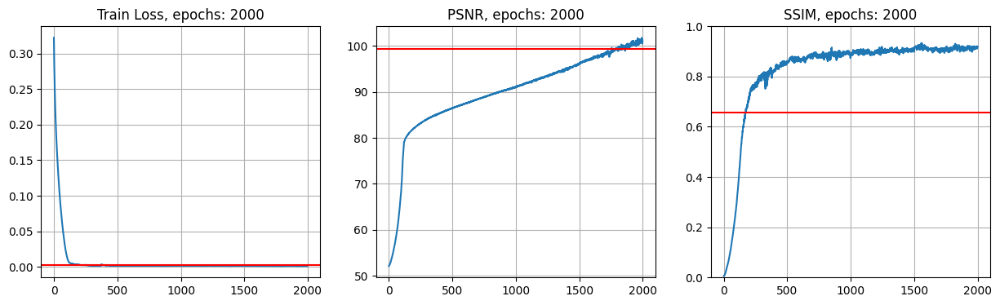

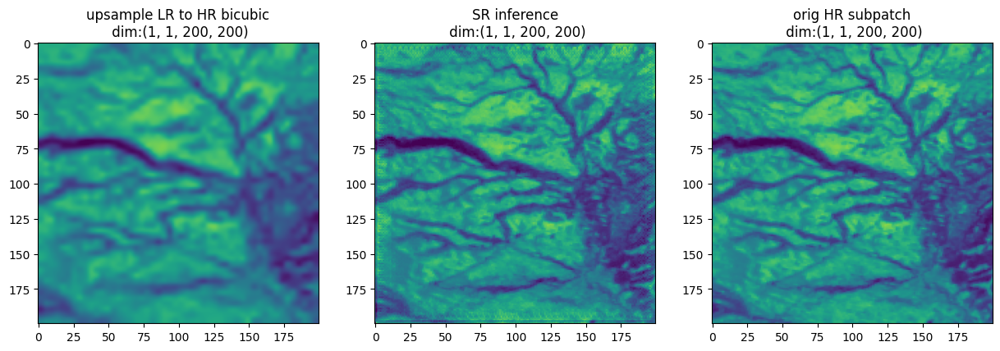

In [6]:
# Training params
nepochs = 2000
adjust_learning_rate(optimizer, new_lr=1e-05)

# Training loop
model.train()
cache = np.zeros((nepochs, 3))

gt_loss = loss_function(child_up, hr)
gt_psnr = psnr(child_up, hr)
gt_ssim = ssim(child_up, hr)

progression_bar = tqdm(range(nepochs), total=nepochs)
for e in progression_bar:
    output = model(child_up).to(DEVICE)
    loss = loss_function(output, hr)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    #scheduler.step(loss.item())
    
    # Performance metrics
    cache[e, 0] = loss.item()
    cache[e, 1] = psnr(output, hr)
    cache[e, 2] = ssim(output, hr) 
    dloss = loss.item() - gt_loss 
    dpsnr = psnr(output, hr) - gt_psnr
    dssim = ssim(output, hr) - gt_ssim
    progression_bar.set_postfix_str(f"Loss «{(loss.item()):.9f}»  Delta Loss «{(dloss):.9f}»  Delta PSNR «{(dpsnr):.9f}»  Delta SSIM «{(dssim):.9f}»")

# Inference Eval
print(f"\n SR-HR:  PSNR ({psnr(output, hr):.6f})  Loss ({loss_function(output, hr):.10f})")
print(f" LR-HR:  PSNR ({psnr(child_up, hr):.6f})  Loss ({loss_function(child_up, hr):.10f})")

# Plot training curves
titles = ["Train Loss", "PSNR", "SSIM"] 
_, axs = plt.subplots(1, 3, figsize=(15,4))
axs[0].plot(cache[:,0]); axs[0].axhline(gt_loss.item(), c="red"); axs[0].set_title(f"{titles[0]}, epochs: {nepochs}");  axs[0].grid()
axs[1].plot(cache[:,1]); axs[1].axhline(gt_psnr, c="red"); axs[1].set_title(f"{titles[1]}, epochs: {nepochs}");  axs[1].grid()
axs[2].plot(cache[:,2]); axs[2].axhline(gt_ssim, c="red"); axs[2].set_title(f"{titles[2]}, epochs: {nepochs}"); axs[2].set_ylim((0,1));  axs[2].grid()


# Plot results
titles = ["upsample LR to HR bicubic", "SR inference", "orig HR subpatch"] 
toplot = (child_up, output, hr)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()

### Now testing zeroshot upscaling
Original HR upsampling according to `scale_factor` and bicubic interpolation.

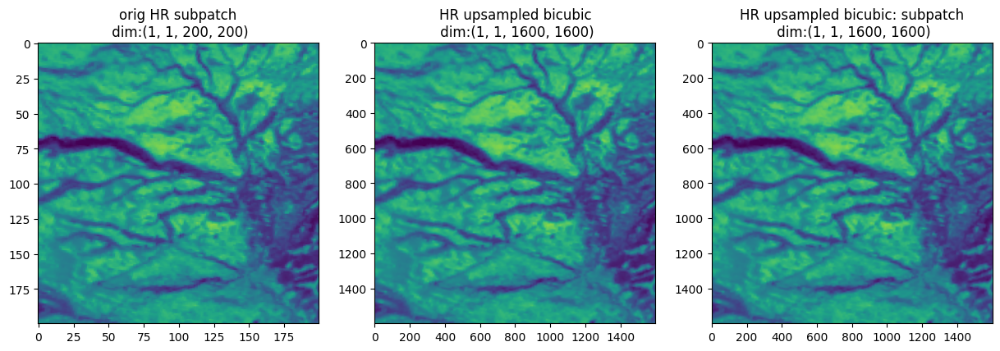

In [65]:
# Trying zeroshot scale factor
new_scale_factor = scale_factor
new_scale_factor = 8

hr_up = F.interpolate(hr, scale_factor=new_scale_factor, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (1600,1600)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

# Plot
titles = ["orig HR subpatch", "HR upsampled bicubic", "HR upsampled bicubic: subpatch"] 
toplot = (hr, hr_up, hr_up_subpatch)
_, axs = plt.subplots(1,len(toplot),figsize=(15,6))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()    

Self-supervised trained inference estimation.

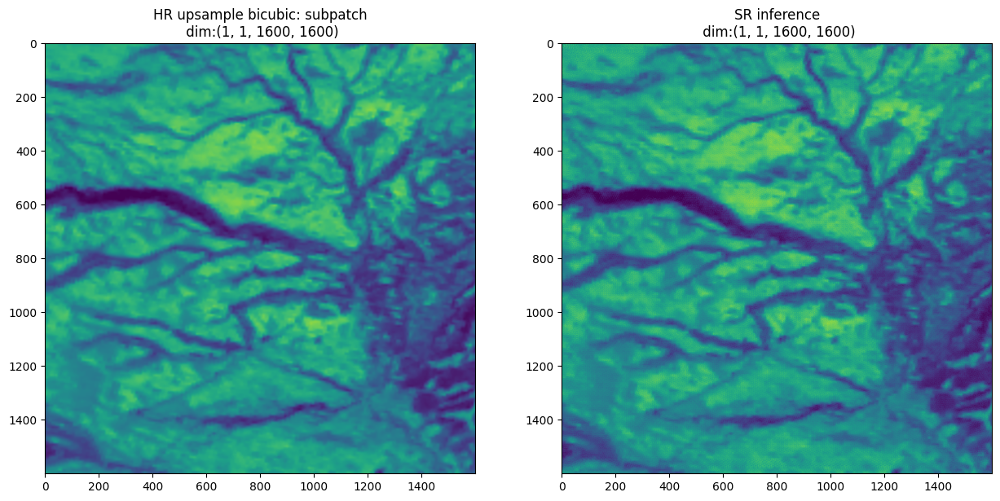

In [66]:
# Evaluating over the new upscaled version
model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)
    

# Plot
titles = ["HR upsample bicubic: subpatch", "SR inference"] 
toplot = (hr_up_subpatch, inference)
_, axs = plt.subplots(1,len(toplot),figsize=(15,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.show()   

### Residual mapping

Avg bias: 5.510284609044902e-06
Max pos-neg bias: 0.019290268421173096 -0.012810826301574707


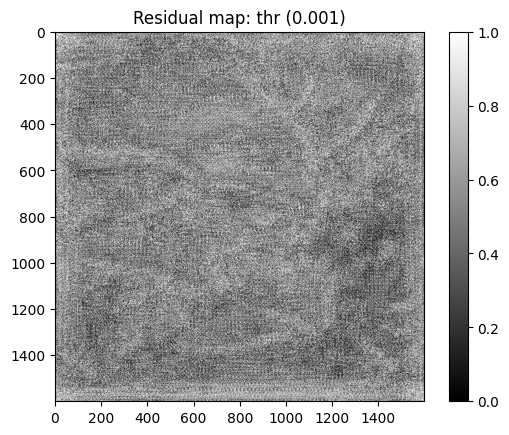

In [71]:
thr = 0.001
diff = inference.detach().to("cpu").squeeze() - hr_up_subpatch.detach().to("cpu").squeeze()
print("Avg bias:", diff.float().mean().item())
print("Max pos-neg bias:", diff.max().item(), diff.min().item())

diff = torch.where(torch.abs(diff)>thr, 1, 0)
plt.imshow(diff, cmap="gray")
plt.title(f"Residual map: thr ({thr})")
plt.colorbar() 
plt.show()

---

# Batch based Training + Inference

Simple optimization procedure allowing to learn a SR function given a fixed `scale_factor` over a fixed `batch_size` amount of elements.
The purpose of the following attempt is to prove that SR over newly unseen subpatches can be performed by a function that had been trained to minimise the objective reconstruction loss over a limited amount of spatial acquisition.

In [26]:
# Load MODIS dataset
PATH_HR = "/mnt/LOCALDATA/STUDENTS/SATELLITE/MODIS/MOD11A1"
filename = "MOD11A1.A2020222.h20v10.061.2021013204929.hdf"

# HR image reading and rescaling values by sf=0.02 (in K)
data = SD(os.path.join(PATH_HR, filename), SDC.READ)
data = data.select("LST_Day_1km")[:,:].astype(np.float64)
data = torch.Tensor(data*0.02)

# Imputing zerofilled
data = torch.where(data==0, data[data!=0].mean(), data)

# Rescaling dividing by max value --> [0,1]
dmin, dmax = data.min().item(), data.max().item()
data = data / dmax

# Collect mean and std to clip histogram plotting
datamean, datastd = data.mean().item(), data.std().item()

# Upper and lower value limits for visualisation purposes
llim, ulim = datamean - 2.5*datastd, datamean + 2.5*datastd

Subpatch coordinates extraction.

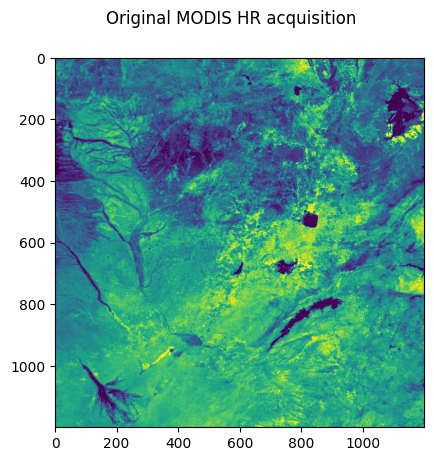

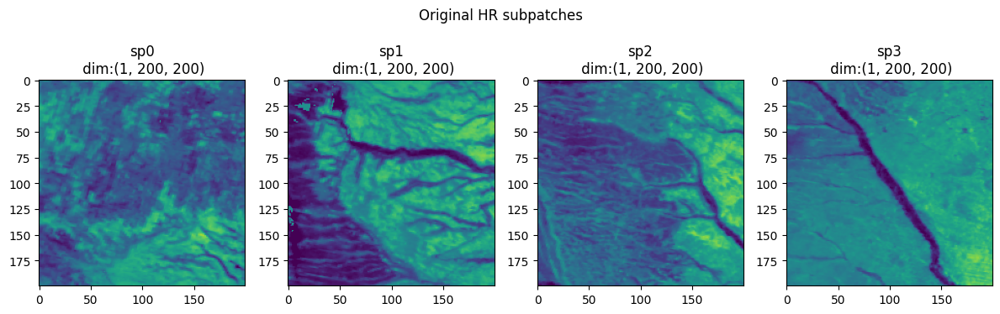

In [37]:
h, w = data.shape
tile_size = 200
nimage_to_plot = 4

# h and w sub-tiles coords
tiles_h = [(i, i+tile_size) for i in range(0, h, tile_size)] 
tiles_w = [(i, i+tile_size) for i in range(0, w, tile_size)] 

# draw sub-tiles from
subtiles_coords = []
for _i, coord_h in enumerate(tiles_h):
    for _j, coord_w in enumerate(tiles_w):
        subtiles_coords.append((coord_w[0], coord_w[1], coord_h[0], coord_h[1]))

# Drawing 4 countigous sub-patches
batch_size, nsubpatches = 8, len(subtiles_coords)

subpatches = [data[y0:y1,x0:x1].unsqueeze(0).unsqueeze(0) \
    for i, (y0, y1, x0, x1) in enumerate(subtiles_coords)]

train_data = torch.cat(subpatches[0:batch_size], 0)
test_data  = torch.cat(subpatches[batch_size: nsubpatches], 0)
       
                       
plt.imshow(data, vmin = llim, vmax = ulim)
plt.suptitle("Original MODIS HR acquisition")
plt.show()

# Plot
plotsubpatch(subpatches = train_data[0:nimage_to_plot],  titles = [f"sp{i}" for i in range(nimage_to_plot)],
             suptitle = "Original HR subpatches", llim=llim, ulim=ulim)

### LR generation from HR subpatches

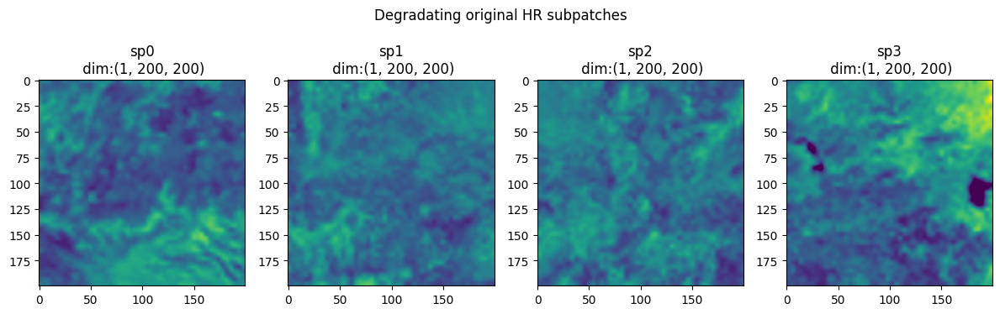

In [28]:
hr = torch.cat(sps, 0)

scale_factor = 4
nimage_to_plot = 4

# Interpolate
child = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)

# Plot
plotsubpatch(subpatches = child_up[0:nimage_to_plot],
         titles = [f"sp{i}" for i in range(nimage_to_plot)],
         suptitle = "Degradating original HR subpatches", llim=llim, ulim=ulim)

### Model initialization

In [29]:
nchannels = 1

# Model initialisation
model = MRUNet(n_channels=nchannels, n_resblocks=1).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer     = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
            factor=0.1, patience=10, threshold=10e-7, threshold_mode='abs')


def adjust_learning_rate(optimizer, new_lr):
    """Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

### Training Loop

100%|██████████| 100/100 [00:26<00:00,  3.72it/s, Loss «0.005379731»  Delta Loss «0.003415601»  Delta PSNR «-14.882690430»  Delta SSIM «-0.148681879»]



 SR-HR:  PSNR (84.499054)  Loss (0.0053797308)
 LR-HR:  PSNR (99.381744)  Loss (0.0019641300)


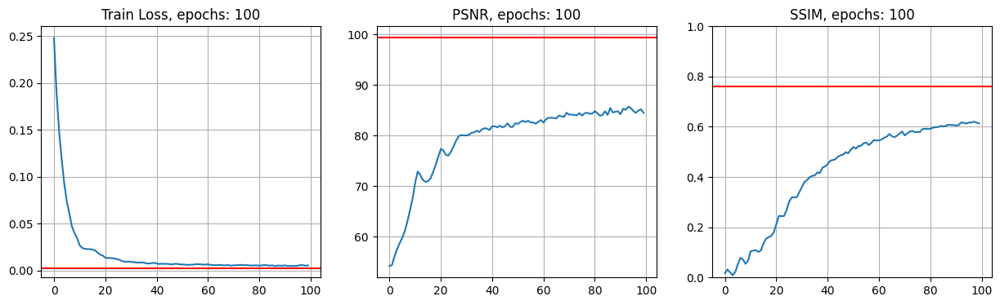

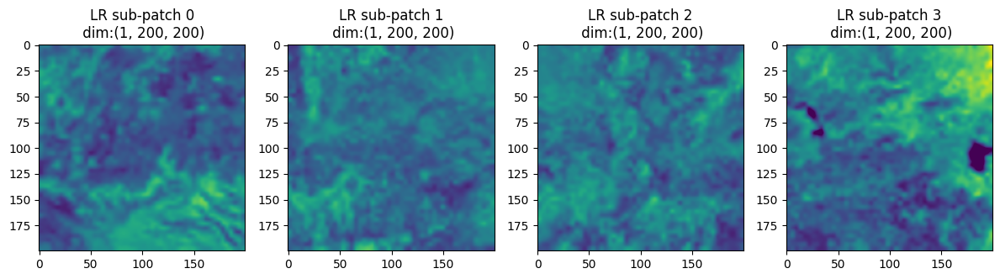

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

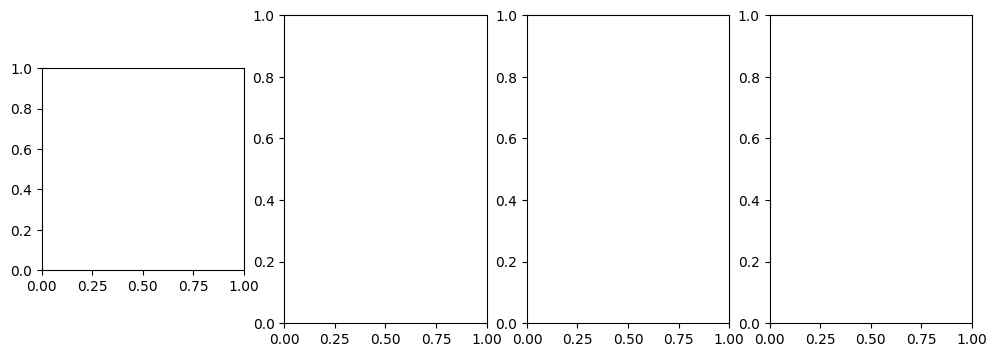

In [30]:
# To DEVICE
hr = hr.to(DEVICE)
child = child.to(DEVICE)
child_up = child_up.to(DEVICE)

# Training params
nepochs = 100
adjust_learning_rate(optimizer, new_lr=10e-5)

# Training loop
model.train()
cache = np.zeros((nepochs, 3))

gt_loss = loss_function(child_up, hr)
gt_psnr = psnr(child_up, hr)
gt_ssim = ssim(child_up, hr)

progression_bar = tqdm(range(nepochs), total=nepochs)
for e in progression_bar:
    output = model(child_up).to(DEVICE)
    loss = loss_function(output, hr)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    #scheduler.step(loss.item())
    
    # Performance metrics
    cache[e, 0] = loss.item()
    cache[e, 1] = psnr(output, hr)
    cache[e, 2] = ssim(output, hr) 
    dloss = loss.item() - gt_loss 
    dpsnr = psnr(output, hr) - gt_psnr
    dssim = ssim(output, hr) - gt_ssim
    progression_bar.set_postfix_str(f"Loss «{(loss.item()):.9f}»  Delta Loss «{(dloss):.9f}»  Delta PSNR «{(dpsnr):.9f}»  Delta SSIM «{(dssim):.9f}»")

# Inference Eval
print(f"\n SR-HR:  PSNR ({psnr(output, hr):.6f})  Loss ({loss_function(output, hr):.10f})")
print(f" LR-HR:  PSNR ({psnr(child_up, hr):.6f})  Loss ({loss_function(child_up, hr):.10f})")

# Plot training curves
titles = ["Train Loss", "PSNR", "SSIM"] 
_, axs = plt.subplots(1, 3, figsize=(15,4))
axs[0].plot(cache[:,0]); axs[0].axhline(gt_loss.item(), c="red"); axs[0].set_title(f"{titles[0]}, epochs: {nepochs}");  axs[0].grid()
axs[1].plot(cache[:,1]); axs[1].axhline(gt_psnr, c="red"); axs[1].set_title(f"{titles[1]}, epochs: {nepochs}");  axs[1].grid()
axs[2].plot(cache[:,2]); axs[2].axhline(gt_ssim, c="red"); axs[2].set_title(f"{titles[2]}, epochs: {nepochs}"); axs[2].set_ylim((0,1));  axs[2].grid()

# Plot LR / SR / HR subpatches
plotsubpatch(subpatches = child_up[0:nimage_to_plot],
         titles = [f"LR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)
plotsubpatch(subpatches = output[0:nimage_to_plot],
         titles = [f"SR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)
plotsubpatch(subpatches = hr[0:nimage_to_plot],
         titles = [f"HR sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

### Testing zeroshot performance over original HR subpatches

Visual Assessment: the currently trained model is tested to perform super-resolution over the original spatial subpatches on which it was trained on upsampled to $\times$ `scale_factor` dimension. 

In [ ]:
hr_up = F.interpolate(hr, scale_factor=scale_factor, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (800,800)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

hr_up_subpatch= hr_up_subpatch.to(DEVICE)

model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)

# Plot SR
titles = [f"HR bic sub-patch {i}" for i in range(batch_size)] 
toplot = hr_up_subpatch[0:4]
_, axs = plt.subplots(1, toplot.shape[0], figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"), vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.tight_layout()
plt.show()

# Plot SR from HR
plotsubpatch(subpatches = inference[0:nimage_to_plot],
         titles = [f"SR from HR bic sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

### Testing zeroshot performance over new HR subpatches
Visual Assessment: new spatial acquisitions are extracted from the original HR image in order to evaluate the performance of the newly trained SR model when evaluating unseen spatial pattern.

In [ ]:
# Drawing 4 countigous sub-patches
batch_size = 4
sps = []
for i in range(batch_size):
    y0,y1,x0,x1 = subtiles_coords["tiles_n"][i+5]
    sp = data[x0:x1,y0:y1].unsqueeze(0).unsqueeze(0)
    sps.append(sp)
hr = torch.cat(sps,0)
    
# Upscaling to target dimension (x ScaleFactor)
hr_up = F.interpolate(hr, scale_factor=scale_factor, mode="bicubic", antialias=True)
hr_up = hr_up.to(DEVICE)

# Subpatch selection
patch_size = (400,400)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

hr_up_subpatch= hr_up_subpatch.to(DEVICE)

model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)

# Plot SR / HR
plotsubpatch(subpatches = hr_up_subpatch,
         titles =[f"HR bic sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)
plotsubpatch(subpatches = inference,
         titles =[f"SR from HR bic sub-patch {i}" for i in range(batch_size)],
         suptitle = None, llim=llim, ulim=ulim)

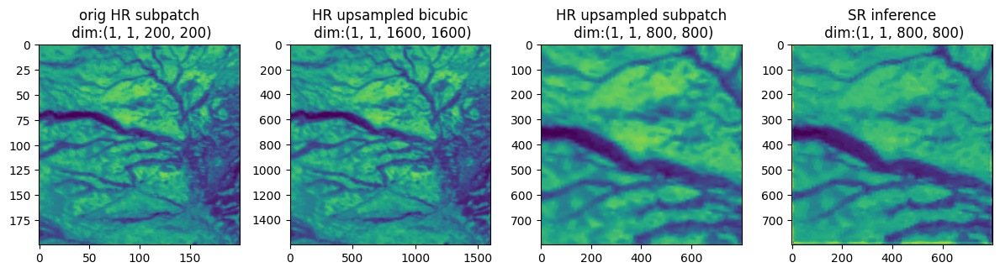

In [31]:
# Subpatch extraction
hlim, wlim = (200,400), (100,300)
hr = data[hlim[0]:hlim[1], wlim[0]:wlim[1]]
hr = hr.reshape(1, 1, hr.shape[-2], hr.shape[-1])
hr_up = F.interpolate(hr, scale_factor=8, mode="bicubic", antialias=True).to(DEVICE)

# Subpatch selection
patch_size = (800,800)
hr_up_subpatch = tt.Compose([tt.RandomCrop(patch_size)])(hr_up)

# Tesing given a single large image
model.eval()
with torch.no_grad():
    inference = model(hr_up_subpatch).to(DEVICE)   
    
# Plot
plotsubpatch(subpatches = (hr, hr_up, hr_up_subpatch, inference),
         titles =  ["orig HR subpatch", "HR upsampled bicubic", "HR upsampled subpatch", "SR inference"],
         suptitle = None, llim=llim, ulim=ulim)

### Residual mapping

Avg bias: -0.0010916407918557525
Max pos-neg bias: 0.6883034110069275 -1.3862407207489014


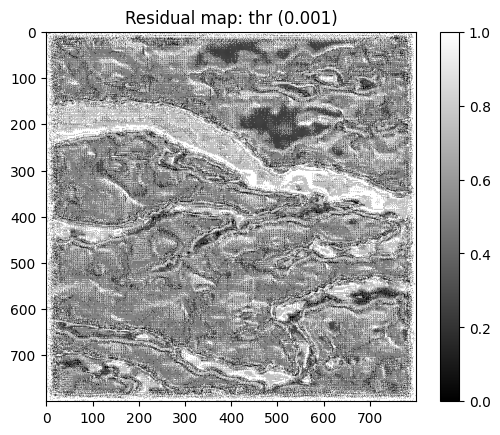

In [10]:
thr = 0.001
diff = inference.detach().to("cpu").squeeze() - hr_up_subpatch.detach().to("cpu").squeeze()
print("Avg bias:", diff.float().mean().item())
print("Max pos-neg bias:", diff.max().item(), diff.min().item())

diff = torch.where(torch.abs(diff)>thr, 1, 0)
plt.imshow(diff, cmap="gray")
plt.title(f"Residual map: thr ({thr})")
plt.colorbar() 
plt.show()

### Inference
Adressing the performance metrics over the residual amounts of subpathces. Test can be done by either:
1. exclusively evaluating the remaining subpatches (those that were excluded from the self-supervised approach), and
2. by estimating SR over the whole image.

In [33]:
total_subtiles = len(subtiles_coords["tiles_n"])

# Drawing Test subpatches
batch_size = 8
test_data = []
for i in range(batch_size, total_subtiles):
    y0,y1,x0,x1 = subtiles_coords["tiles_n"][i]
    tmp = data[x0:x1,y0:y1].unsqueeze(0).unsqueeze(0)
    test_data.append(tmp)    
    
# Gound truth test data
test_data = torch.cat(test_data, 0).to(DEVICE)

# Upscaling to target dimension (x ScaleFactor)
test_child = F.interpolate(test_data, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
test_child_up = F.interpolate(test_child, scale_factor=scale_factor, mode="bicubic", antialias=True)
test_child_up = test_child_up.to(DEVICE)

# Model inference
output = []
model.eval()
with torch.no_grad():
    # Performing iterative inference to manage CUDA memory errors
    output = [model(test_child_up[i,:,:,:].unsqueeze(0)).to(DEVICE)\
              for i in range(test_child_up.shape[0])]
output = torch.cat(output, 0)


In [34]:
mae = loss_function(test_data, output)
print(f"Inference: MAE: {mae}")

Inference: MAE: 0.005896342918276787


---

# Complete Batch based Training and Inference

Testing the whole acquisition's subpatches splitting procedure and training.


In [75]:
# Load MODIS dataset
PATH_HR = "/mnt/LOCALDATA/STUDENTS/SATELLITE/MODIS/MOD11A1"
filename = "MOD11A1.A2020222.h20v10.061.2021013204929.hdf"

# HR image reading and rescaling values by sf=0.02 (in K)
data = SD(os.path.join(PATH_HR, filename), SDC.READ)
data = data.select("LST_Day_1km")[:,:].astype(np.float64)
data = torch.Tensor(data*0.02)

# Imputing zerofilled
data = torch.where(data==0, data[data!=0].mean(), data)

# Rescaling dividing by max value --> [0,1]
dmin, dmax = data.min().item(), data.max().item()
data = data / dmax

# Collect mean and std to clip histogram plotting
datamean, datastd = data.mean().item(), data.std().item()

# Upper and lower value limits for visualisation purposes
llim, ulim = datamean - 2.5*datastd, datamean + 2.5*datastd

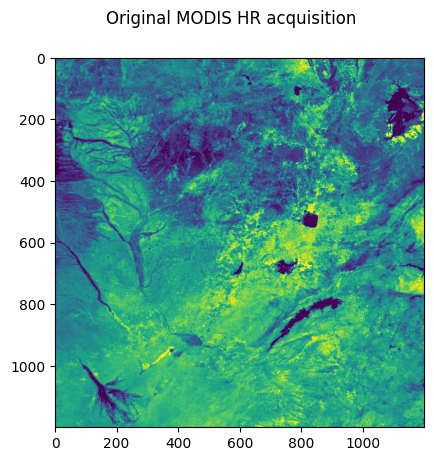

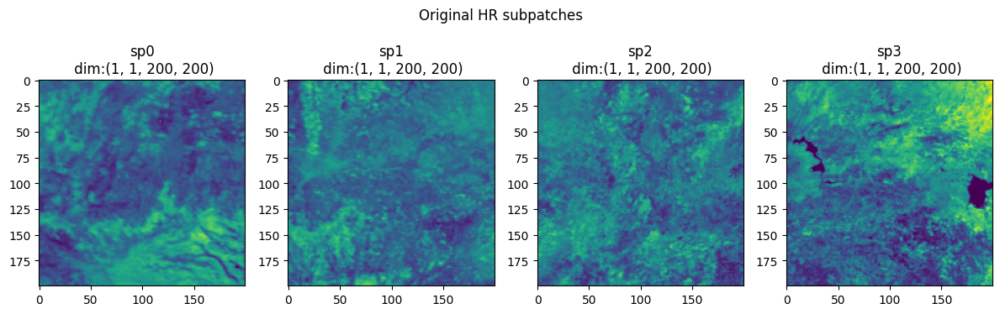

In [92]:
h, w = data.shape
tile_size = 200
batch_size = 8
nimage_to_plot = 4
subtiles_coords = dict()

# h and w sub-tiles coords
tiles_h = [(i, i+tile_size) for i in range(0, h, tile_size)] 
tiles_w = [(i, i+tile_size) for i in range(0, w, tile_size)] 

# draw sub-tiles
subtiles = []
for _i, coord_h in enumerate(tiles_h):
    for _j, coord_w in enumerate(tiles_w):
        subtiles.append((coord_w[0], coord_w[1], coord_h[0], coord_h[1]))
subtiles_coords["tiles_n"] = subtiles

# Extract subpatches
sps = []
for i, coords in enumerate(subtiles_coords["tiles_n"]):
    y0,y1,x0,x1 = subtiles_coords["tiles_n"][i]
    tmp = data[x0:x1,y0:y1].unsqueeze(0).unsqueeze(0)
    sps.append(tmp)   

# Plot Whole data
plt.imshow(data, vmin = llim, vmax = ulim)
plt.suptitle("Original MODIS HR acquisition")

# Plotting subpatches
titles = [f"sp{i}" for i in range(nimage_to_plot)] 
toplot = sps[0:nimage_to_plot]
_, axs = plt.subplots(1,len(toplot),figsize=(12,4))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"),
                  vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.suptitle("Original HR subpatches")
plt.tight_layout()
plt.show() 

### LR generation from HR subpatches

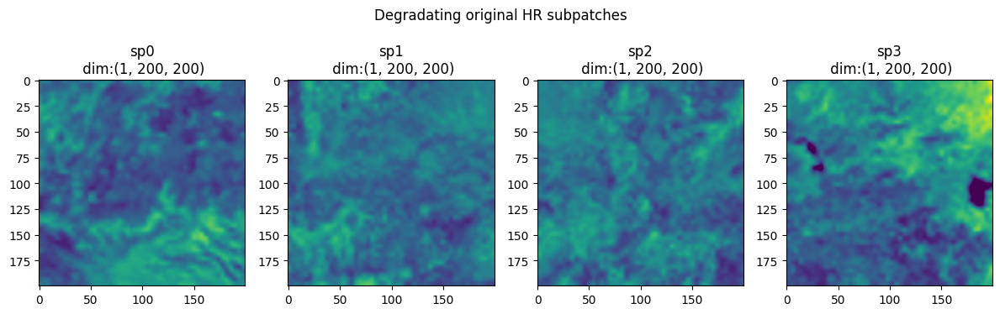

In [100]:
hr = torch.cat(sps, 0)
scale_factor = 4

# Interpolate
child = F.interpolate(hr, scale_factor=1/scale_factor, mode="bicubic", antialias=True)
child_up = F.interpolate(child, scale_factor=scale_factor, mode="bicubic", antialias=True)

# Plot


### Model initialization

In [105]:
nchannels = 1

# Model initialisation
model = MRUNet(n_channels=nchannels, n_resblocks=1).to(DEVICE)

# Training specs
loss_function = torch.nn.L1Loss()
optimizer     = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
            factor=0.1, patience=10, threshold=10e-7, threshold_mode='abs')
# To DEVICE
hr = hr.to(DEVICE)
child = child.to(DEVICE)
child_up = child_up.to(DEVICE)


def adjust_learning_rate(optimizer, new_lr):
    """Manually adjusting lr for a given optimizer
    """
    for param_group in optimizer.param_groups:
        param_group['lr'] = new_lr

### Training Loop

In [107]:
# Training params
nepochs = 100
batch_size, nbatch = 16, hr.shape[0]
adjust_learning_rate(optimizer, new_lr=10e-5)

# Training loop
model.train()
cache = np.zeros((nepochs, 3))

gt_loss = loss_function(child_up, hr)
gt_psnr = psnr(child_up, hr)
gt_ssim = ssim(child_up, hr)

progression_bar = tqdm(range(nepochs), total=nepochs)

for e in progression_bar:
    
    cum_loss, cum_psnr, cum_ssim, n_sample = 0., 0., 0., 0.

    for b in range(0, nbatch, batch_size):
        
        # Extract batch 
        curr_hr = hr[b: b+batch_size, :, :, :].to(DEVICE)
        curr_child_up = child_up[b: b+batch_size, :, :, :].to(DEVICE)

        # Perform inference
        output = model(curr_child_up).to(DEVICE)
        loss = loss_function(output, curr_hr)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        #scheduler.step(loss.item())
        
        # Estimate performance metrics over batch
        cum_loss += loss.item()
        cum_psnr += psnr(output, curr_hr)
        cum_ssim += ssim(output, curr_hr)  
        n_sample += curr_hr.shape[0]
    
    # Performance metrics over current epoch and delta
    cache[e, 0] = cum_loss / n_sample
    cache[e, 1] = cum_psnr / n_sample
    cache[e, 2] = cum_ssim / n_sample
    dloss = cache[e, 0] - gt_loss 
    dpsnr = cache[e, 1] - gt_psnr
    dssim = cache[e, 2] - gt_ssim
    
    progression_bar.set_postfix_str(f"Loss «{(loss.item()):.9f}»  Delta Loss «{(dloss):.9f}»  Delta PSNR «{(dpsnr):.9f}»  Delta SSIM «{(dssim):.9f}»")

# Inference Eval
print(f"\n SR-HR:  PSNR ({psnr(output, hr):.6f})  Loss ({loss_function(output, hr):.10f})")
print(f" LR-HR:  PSNR ({psnr(child_up, hr):.6f})  Loss ({loss_function(child_up, hr):.10f})")

# Plot training curves
titles = ["Train Loss", "PSNR", "SSIM"] 
_, axs = plt.subplots(1, 3, figsize=(15,4))
axs[0].plot(cache[:,0]); axs[0].axhline(gt_loss.item(), c="red"); axs[0].set_title(f"{titles[0]}, epochs: {nepochs}");  axs[0].grid()
axs[1].plot(cache[:,1]); axs[1].axhline(gt_psnr, c="red"); axs[1].set_title(f"{titles[1]}, epochs: {nepochs}"); axs[1].grid()
axs[2].plot(cache[:,2]); axs[2].axhline(gt_ssim, c="red"); axs[2].set_title(f"{titles[2]}, epochs: {nepochs}"); axs[2].set_ylim((0,1));  axs[2].grid()

# Plot LR 
titles = [f"LR sub-patch {i}" for i in range(batch_size)] 
toplot = child_up[0:4]
_, axs = plt.subplots(1, toplot.shape[0], figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"), vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.tight_layout()
plt.show()

# Plot SR
titles = [f"SR sub-patch {i}" for i in range(batch_size)] 
toplot = output[0:4]
_, axs = plt.subplots(1, toplot.shape[0], figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"), vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.tight_layout()
plt.show()

# Plot HR
titles = [f"HR sub-patch {i}" for i in range(batch_size)] 
toplot = hr[0:4]
_, axs = plt.subplots(1, toplot.shape[0], figsize=(12,8))
for i,item in enumerate(toplot):
    axs[i].imshow(item.squeeze().detach().to("cpu"), vmin = llim, vmax = ulim)
    axs[i].set_title(f"{titles[i]}\n dim:{tuple(item.shape)}")
plt.tight_layout()
plt.show()

100%|██████████| 100/100 [01:36<00:00,  1.04it/s, Loss «0.001184501»  Delta Loss «-0.001654241»  Delta PSNR «-91.494182163»  Delta SSIM «-0.720813177»]


RuntimeError: The size of tensor a (4) must match the size of tensor b (36) at non-singleton dimension 0


---


# Testing ZSSR Class

In [3]:
import os
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim_sk

import PIL as PIL
from pyhdf.SD import SD, SDC
from piqa import SSIM
from dloader import *
from srcnn import *
from unet import *
from resunet import *
from haunet import *
from mrunet import *
from zssrnet import *

DEVICE  = "cuda:0" if torch.cuda.is_available() else "cpu"
PATH_LR = "/mnt/LOCALDATA/STUDENTS/SATELLITE/MODIS/MOD11B1"
PATH_HR = "/mnt/LOCALDATA/STUDENTS/SATELLITE/MODIS/MOD11A1"
QA      = "/home/giacomo.t/src/scanning_paired_dataset.csv"
PARAMS  = "/home/giacomo.t/src/train_params_tiles_2019_2020_2021_2022.csv"
UP_SCALE = 6
KERNEL_SIZE = 5
SEED = 8609

class PSNR:
    """Peak Signal to Noise Ratio
    img1 and img2 have range [0, 255]"""
    def __init__(self):
        self.name = "PSNR"
    @staticmethod
    def __call__(img1, img2):
        mse = torch.mean((img1 - img2) ** 2)
        return (20 * torch.log10(255.0 / torch.sqrt(mse))).item()


# Ideally put this on torch
class SSIM:
    """Structural Similarity for matched LR-HR
    """
    def __init__(self):
        self.name = "SSIM"
    @staticmethod
    def __call__(lr, hr):
        lr = lr.squeeze().cpu().detach().numpy()
        hr = hr.squeeze().cpu().detach().numpy()
        return ssim_sk(lr, hr, data_range=hr.max()-hr.min(), channel_axis=0)


psnr = PSNR()
ssim = SSIM()


def get_loss():
    pass

def build_model(model_name):
    if model_name == None:
        pass

    optimizer = torch.optim.AdamW(model.parameters(), lr=0.001, weight_decay=0)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                factor=0.1, patience=15, threshold=10e-8, threshold_mode='abs')

    return model, optimizer, scheduler

def plotsomething():
    pass


def get_subtiles(data, tile_size):
    """ Return a list of subtiles coordinates accoring to tile_size
    (y0, y1, x0, x1)
    """
    subtiles = []
    h, w = data.shape[-2], data.shape[-1]
    tiles_h = [(i, i+tile_size) for i in range(0, h, tile_size)] 
    tiles_w = [(i, i+tile_size) for i in range(0, w, tile_size)]  
    for _i, coord_h in enumerate(tiles_h):
        for _j, coord_w in enumerate(tiles_w):
            subtiles.append((coord_h[0], coord_h[1], coord_w[0], coord_w[1]))
    return  subtiles


class ReadData():

    def __init__(self, filepath, layername):
        self.filepath = filepath
        self.layername = layername

    @staticmethod
    def __call__():
        pass



class ZSSR():

    def __init__(self, data, scale_factor, subpatch_size, model,
        optimizer, scheduler, thresholds, nepochs=1000, nchannels=1, fillvalue=0, nstd=2.5):

        assert isinstance(data, torch.Tensor), "Input Data must be a torch.Tensor."
        self.orig = data
        self.data = data
        self.scale_factor = scale_factor
        self.subpatch_size = subpatch_size
        self.thresholds = thresholds
        self.nepochs = nepochs
        self.nchannels = nchannels
        self.fillvalue = fillvalue

        # Loss
        self.loss_function = torch.nn.L1Loss()
        
        # Model specs
        self.model, self.model_stdict = model, model.state_dict()
        self.optimizer, self.optimizer_stdict = optimizer, optimizer.state_dict()
        self.scheduler, self.scheduler_stdict = scheduler, scheduler.state_dict()
        self.init_learning_rate = self.optimizer_stdict["param_groups"][0]["lr"]

        # List of subpatches coords
        self.subtiles_coords = get_subtiles(self.data, self.subpatch_size)

        # Rescale image
        self.data = torch.where(self.data==self.fillvalue, self.orig[self.data!=0].mean(), self.data)
        self.data / data.max()

        # Upper and lower value limits for visualisation purposes
        datamean, datastd = self.data.mean().item(), self.data.std().item()
        self.llim = datamean - nstd*datastd
        self.ulim = datamean + nstd*datastd


    def _adjust_learning_rate(self, new_learning_rate):
        for param in self.optimizer.param_groups:
            param['lr'] = new_learning_rate

    def _reset_training_spec(self):
        """Re-initialise model, opt and scheduler before subpatch training 
        """
        self.model.load_state_dict(self.model_stdict)
        self.optimizer.load_state_dict(self.optimizer_stdict)
        self.scheduler.load_state_dict(self.scheduler_stdict)

    def _eval(self, lr, hr):
        raise NotImplementedError
        return curr_psnr, curr_ssim

    def _get_hr(self, idx):
        """ Extract subpatch from original image
        """
        y0, y1, x0, x1 = self.subtiles_coords[idx]
        hr = self.data[y0 : y1, x0 : x1]
        hr = hr.reshape(1, self.nchannels, hr.shape[-2], hr.shape[-1])
        return hr

    def _get_lr(self, hr):
        """ Perform downgrade over hr subpatch
        """
        lr = F.interpolate(hr, scale_factor=1/self.scale_factor, mode="bicubic", antialias=True)
        lr = F.interpolate(lr, scale_factor=self.scale_factor, mode="bicubic", antialias=True)
        print(hr.shape, lr.shape)
        assert hr.shape == lr.shape, "child dimension mismatch"
        return lr

    def _sr_run(self, nepochs, lr, hr):
        """ Perform a single run
        """
        cache = list()

        lr = lr.to(DEVICE)
        hr = hr.to(DEVICE)

        # Estimate reference metrics
        gt_loss = self.loss_function(lr, hr)
        gt_psnr = psnr(lr, hr)
        gt_ssim = ssim(lr, hr)

        model.train()
        progression_bar = tqdm(range(nepochs), total=nepochs)
        for e in progression_bar:
            output = self.model(lr).to(DEVICE)
            loss   = self.loss_function(output, hr)
            loss.backward()
            self.optimizer.step()
            self.optimizer.zero_grad()
            self.scheduler.step(loss.item())
            
            # Metrics 
            curr_psnr = psnr(output, hr)
            curr_ssim = ssim(output, hr)

            # Delta estimation
            dloss = loss.item() - gt_loss 
            dpsnr = curr_psnr - gt_psnr
            dssim = curr_ssim - gt_ssim

            # Performance metrics storing
            cache.append([loss.item(), curr_psnr, curr_ssim])

            # Display
            progression_bar.set_postfix_str(f"Loss «{(loss.item()):.9f}»  Delta Loss «{(dloss):.9f}»  Delta PSNR «{(dpsnr):.9f}»  Delta SSIM «{(dssim):.9f}»")

        return output, cache


    def _sr_single_subpatch(self, lr, hr, nepochs,
                            learning_rate_sf=0.01, nepochs_sf=0.5,
                            reduce_learning_rate=True, reduce_nepochs=False):
        """ Super Resolve single subpatch perform intraimage opt
        """
        self._reset_training_spec()

        history = list()
        learning_rate = self.init_learning_rate

        # Estimate reference metrics
        gt_loss = self.loss_function(lr, hr)
        gt_psnr = psnr(lr, hr)
        gt_ssim = ssim(lr, hr)

        while True:

            print(f"SR attempt - nepochs: ({nepochs}), learning rate: ({learning_rate})")

            output, cache = self._sr_run(nepochs, lr, hr)
            history.extend(cache)

            curr_loss, curr_psnr, curr_ssim = history[-1]

            # Delta estimation
            dloss = curr_loss - gt_loss 
            dpsnr = curr_psnr - gt_psnr
            dssim = curr_ssim - gt_ssim

            # Convergence condition
            if dssim > self.thresholds["ssim"]:
                return output, np.array(history)
  
            # Update training spec
            learning_rate = learning_rate * learning_rate_sf\
                if reduce_learning_rate else learning_rate
            nepochs = int(nepochs/nepochs_sf)\
                if reduce_nepochs else nepochs
            self._adjust_learning_rate(learning_rate)
         

    def _sr_inference(self, hr):
        """ Perform SR inference over updampled hr subpatch
        """
        print("Performing Inference...", end="  ")
        hr_up = F.interpolate(hr, scale_factor=self.scale_factor, mode="bicubic", antialias=True)
        hr_up = hr_up.to(DEVICE)
        
        self.model.eval()
        with torch.no_grad():
            inference = self.model(hr_up)
            
        print("Done!", end="\n\n")
        return inference


    def sr_image(self):
        """ Perorm SR optimization and inference over image subpatches
        """
        for i in range(len(self.subtiles_coords)):

            print("-"*70,f"\nSubpatch {i+1}/{len(self.subtiles_coords)}")
            hr = self._get_hr(i)
            lr = self._get_lr(hr)

            output, history = self._sr_single_subpatch(lr, hr, self.nepochs)
            inference = self._sr_inference(hr)

            # go on with upsampled HR assemble

In [4]:
model = MRUNet(n_channels=1, n_resblocks=1).to(DEVICE)
loss_function = torch.nn.L1Loss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.0001, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
            factor=0.1, patience=10, threshold=1e-08, threshold_mode='abs')

thresholds = {
    "dloss":-0.01,
    "psnr":0.1,
    "ssim":0.1
}
test = ZSSR(data = data, scale_factor = 4, subpatch_size = 400,
            model = model,
            optimizer = optimizer,
            scheduler = scheduler,
            thresholds = thresholds,
            nepochs = 100,
            nchannels=1, fillvalue=0, nstd=2.5)
    

In [5]:
test.sr_image()

---------------------------------------------------------------------- 
Subpatch 1/9
torch.Size([1, 1, 400, 400]) torch.Size([1, 1, 400, 400])
SR attempt - nepochs: (100), learning rate: (0.0001)


100%|██████████| 100/100 [00:21<00:00,  4.75it/s, Loss «0.003808836»  Delta Loss «0.001031110»  Delta PSNR «-10.264213562»  Delta SSIM «-0.164072216»]


Performing Inference...  

OutOfMemoryError: CUDA out of memory. Tried to allocate 1.22 GiB (GPU 0; 7.79 GiB total capacity; 5.06 GiB already allocated; 989.56 MiB free; 5.72 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [55]:
!nvidia-smi

Mon Oct  7 12:28:35 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 4000     On   | 00000000:65:00.0 Off |                  N/A |
| 30%   40C    P8     9W / 125W |   6912MiB /  8192MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------